In [1]:
include("functions.jl")
using Plots, JLD2, LaTeXStrings, FileIO

## Gamma = 1e-3

### Analyzing Error Corrected Data

In [22]:
#Try Trajectory 3,49
@load "Z:/master_work/5_atom_correction/N_atoms=5_γ_decay=0.001_Ntraj=49.jld2"
population_data = population_data;
corrected_population_data = corrected_population_data;
fidelity_data = fidelity_data;
# end_time = end_time;

50001-element Vector{Float64}:
 0.0
 0.0008851664606481791
 3.0475386665784754e-5
 0.0008768151747062802
 2.825417323037982e-5
 0.0008470861939713359
 7.799315790180117e-5
 0.0008282593917101622
 9.105053322855383e-5
 0.0007837016019038856
 ⋮
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0
 0.0

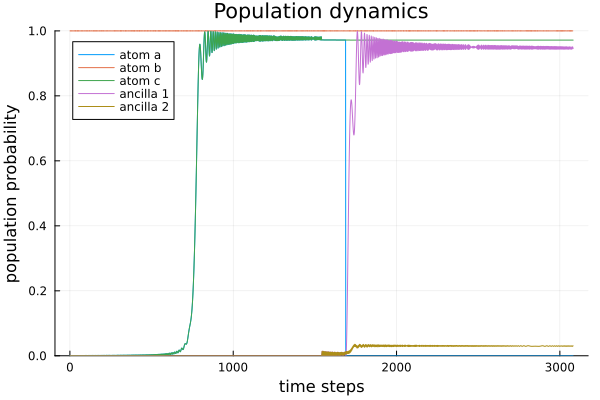

In [23]:
plot(population_data[:a],  ylim=[0,1], label="atom a", xlabel="time steps", ylabel="population probability", title="Population dynamics")
plot!(population_data[:b], label="atom b")
plot!(population_data[:c], label="atom c")
plot!(population_data[:a1],label="ancilla 1")
plot!(population_data[:a2], label="ancilla 2")

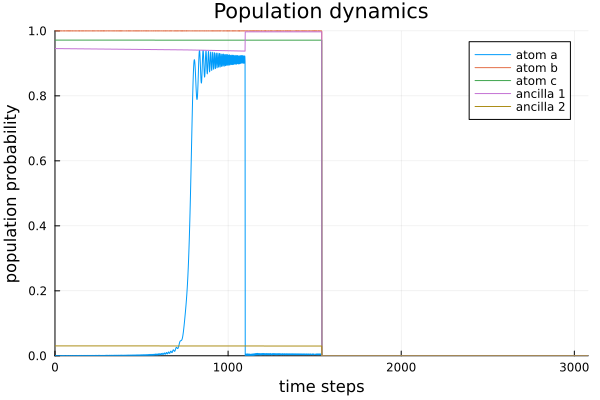

In [24]:
plot(corrected_population_data[:a], xlim=[0,10*tspan[end]],  ylim=[0,1], label="atom a", xlabel="time steps", ylabel="population probability", title="Population dynamics")
plot!(corrected_population_data[:b], label="atom b")
plot!(corrected_population_data[:c], label="atom c")
plot!(corrected_population_data[:a1],label="ancilla 1")
plot!(corrected_population_data[:a2], label="ancilla 2")

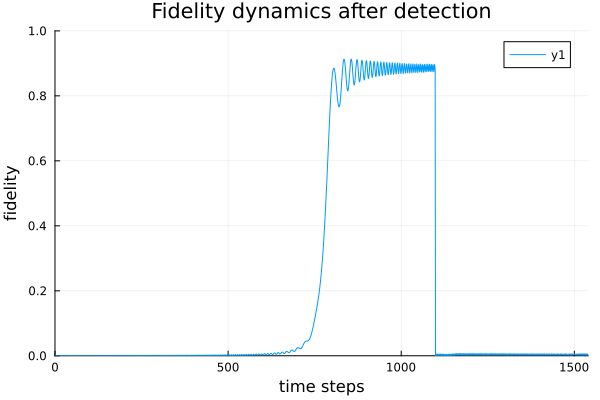

In [25]:
plot(fidelity_data, xlim=[0,10*tspan2[end]], ylim=[0,1], xlabel="time steps", ylabel="fidelity", title="Fidelity dynamics after detection")

### Average analysis

In [56]:
@load "Z:/master_work/5_atom_correction/N_atoms=5_γ_decay=0.001_Ntraj=100_avg.jld2"
avg_population_data = avg_population_data;
avg_corrected_population_data = avg_corrected_population_data;
avg_fidelity_data = avg_fidelity_data;

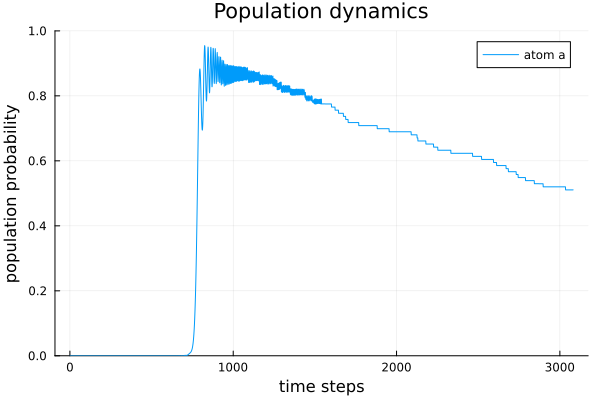

In [ ]:
plot(avg_population_data[:abc],  ylim=[0,1], label="atom a", xlabel="time steps", ylabel="population probability", title="Fidelity dynamics before protocol")

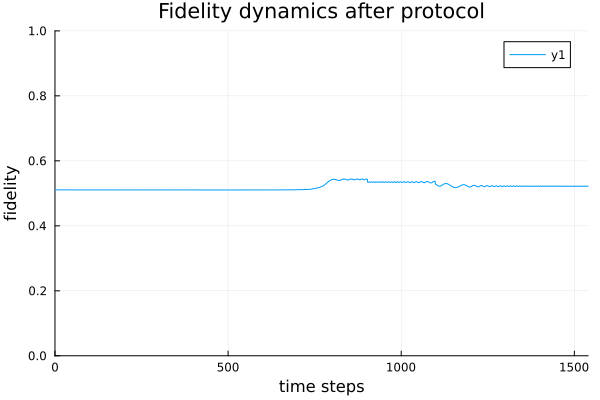

In [10]:
plot(avg_fidelity_data, xlim=[0,10*tspan2[end]], ylim=[0,1], xlabel="time steps", ylabel="fidelity", title="Fidelity dynamics after protocol")

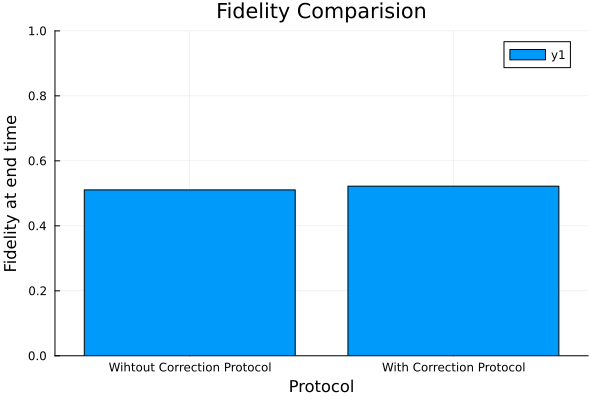

In [ ]:
x = ["Wihtout Correction Protocol", "With Correction Protocol"]
y = [avg_population_data[:abc][end], avg_fidelity_data[1540]]
bar(x,y, title="Fidelity Comparision", xlabel="Protocol", ylabel="Fidelity at end time")

In [58]:
println("Fidelity at end time without correction protocol: ", avg_population_data[:abc][end])
println("Fidelity at end time with correction protocol: ", avg_fidelity_data[1540])

Fidelity at end time without correction protocol: 0.5106162886102729
Fidelity at end time with correction protocol: 0.5220826632324953


## Gamma = 1e-4


In [11]:
P_no_error = (1 - ((1 - exp(-0.0001*240))))^5;
P_1_error = 5*(1 - exp(-0.0001*240))*(1 - ((1 - exp(-0.0001*240))))^4;
P_2_error = 10*(1 - exp(-0.0001*240))^2*(1 - ((1 - exp(-0.0001*240))))^3

println("Probability of no errors: ", P_no_error)
println("Probability of 1 atom errors: ", P_1_error)
println("Probability of 2 atom errors: ", P_2_error)

Probability of no errors: 0.8869204367171574
Probability of 1 atom errors: 0.10771789675774326
Probability of 2 atom errors: 0.005233003909509474


### Analyzing Single Trajectories

In [15]:
@load "Z:/master_work/5_atom_correction/decay_1e_4/N_atoms=5_γ_decay=0.0001_Ntraj=99.jld2"

population_data = population_data;
corrected_population_data = corrected_population_data;
fidelity_data = fidelity_data;

plot(tspan, population_data[:a], label="atom a", xlabel="time steps", ylabel="population probability", title="Population dynamics")
plot!(tspan, population_data[:b], label="atom b")
plot!(tspan, population_data[:c], label="atom c")
plot!(tspan, population_data[:a1],label="ancilla 1")
plot!(tspan, population_data[:a2], label="ancilla 2")

┌ Warning: Opening file with JLD2.MmapIO failed, falling back to IOStream
└ @ JLD2 C:\Users\14aka\.julia\packages\JLD2\nPYlZ\src\JLD2.jl:153


LoadError: LoadError: SystemError: opening file "Z:/master_work/5_atom_correction/decay_1e_4/N_atoms=5_γ_decay=0.0001_Ntraj=99.jld2": No such file or directory
in expression starting at c:\Users\14aka\OneDrive\Documents\master_work\rydberg_qec\codework\5atoms_code\jl_notebook_cell_df34fa98e69747e1a8f8a730347b8e2f_X22sZmlsZQ==.jl:1

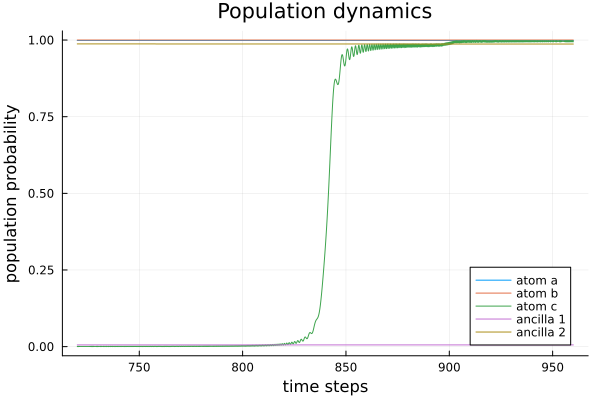

In [48]:
t = [tspan[end]:0.1:tspan[end]+tspan2[end];]
plot(t, corrected_population_data[:a], label="atom a", xlabel="time steps", ylabel="population probability", title="Population dynamics")
plot!(t, corrected_population_data[:b], label="atom b")
plot!(t, corrected_population_data[:c], label="atom c")
plot!(t, corrected_population_data[:a1],label="ancilla 1")
plot!(t, corrected_population_data[:a2], label="ancilla 2")

### Average analysis for time ratio 2:1

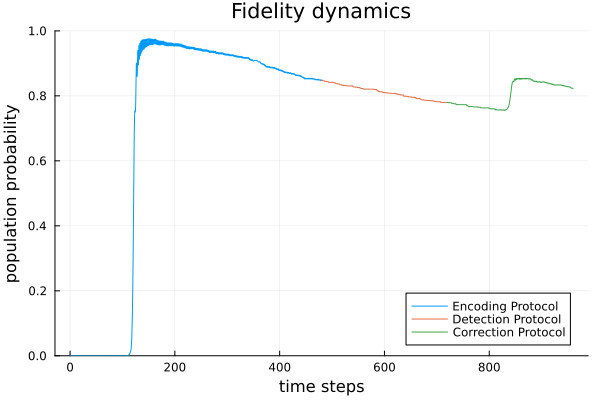

In [74]:
# @load "Z:/master_work/5_atom_correction/decay_1e_4/N_atoms=5_γ_decay=0.0001_Ntraj=100_avg.jld2"
@load "C:/Users/14aka/OneDrive/Documents/master_work/N_atoms=5_γ_decay=0.0001_Ntraj=1000_timeratio_21_avg.jld2"

avg_population_data = avg_population_data;
avg_corrected_population_data = avg_corrected_population_data;
avg_fidelity_data = avg_fidelity_data;

t1 = [0:0.1:2*240;]
t2 = [2*240+0.1:0.1:3*240;]
t3 = [3*240:0.1:4*240;]

avg_population_data1 = avg_population_data[:abc][1:length(t1)]
avg_population_data2 = avg_population_data[:abc][length(t1)+1:end]

plot(t1, avg_population_data1,  ylim=[0,1], label="Encoding Protocol", xlabel="time steps", ylabel="population probability", title="Fidelity dynamics")
plot!(t2, avg_population_data2, label="Detection Protocol")
plot!(t3,avg_fidelity_data, ylim=[0,1], label="Correction Protocol")

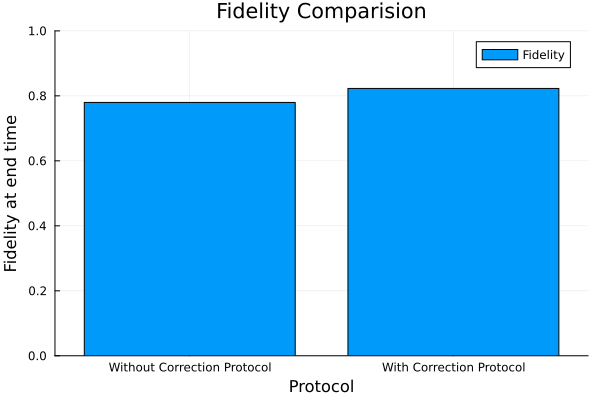

In [6]:
x = ["Without Correction Protocol", "With Correction Protocol"]
y = [avg_population_data[:abc][end], avg_fidelity_data[end]]
bar(x,y, ylim=[0,1], label="Fidelity", title="Fidelity Comparision", xlabel="Protocol", ylabel="Fidelity at end time")

In [7]:
println("Fidelity at end time without correction protocol: ", avg_population_data[:abc][end])
println("Fidelity at end time with correction protocol: ", avg_fidelity_data[end])

Fidelity at end time without correction protocol: 0.7797980971124516
Fidelity at end time with correction protocol: 0.8228984627581081


### Average analysis of timeratio 1:1

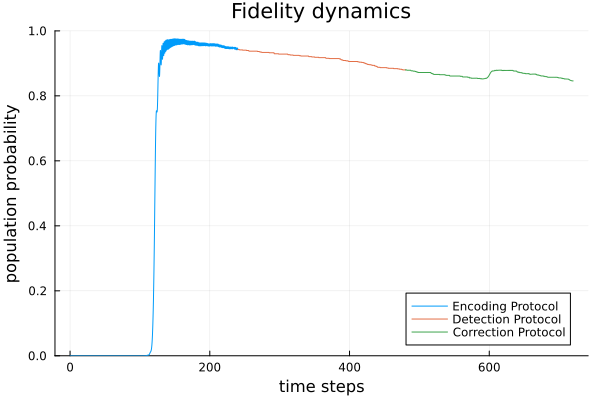

In [50]:
# @load "Z:/master_work/5_atom_correction/decay_1e_4/N_atoms=5_γ_decay=0.0001_Ntraj=100_avg.jld2"
@load "C:/Users/14aka/OneDrive/Documents/master_work/N_atoms=5_γ_decay=0.0001_Ntraj=1000_timeratio_11_avg.jld2"

avg_population_data = avg_population_data;
avg_corrected_population_data = avg_corrected_population_data;
avg_fidelity_data = avg_fidelity_data;

t1 = [0:0.1:240;]
t2 = [240+0.1:0.1:2*240;]
t3 = [2*240:0.1:3*240;]

avg_population_data1 = avg_population_data[:abc][1:length(t1)]
avg_population_data2 = avg_population_data[:abc][length(t1)+1:end]

plot(t1, avg_population_data1,  ylim=[0,1], label="Encoding Protocol", xlabel="time steps", ylabel="population probability", title="Fidelity dynamics")
plot!(t2, avg_population_data2, label="Detection Protocol")
plot!(t3,avg_fidelity_data, ylim=[0,1], label="Correction Protocol")

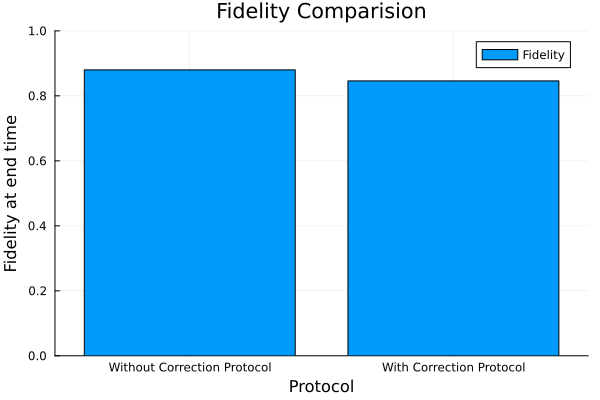

In [4]:
x = ["Without Correction Protocol", "With Correction Protocol"]
y = [avg_population_data[:abc][end], avg_fidelity_data[end]]
bar(x,y, ylim=[0,1], label="Fidelity", title="Fidelity Comparision", xlabel="Protocol", ylabel="Fidelity at end time")

In [5]:
println("Fidelity at end time without correction protocol: ", avg_population_data[:abc][end])
println("Fidelity at end time with correction protocol: ", avg_fidelity_data[end])

Fidelity at end time without correction protocol: 0.8798941116891074
Fidelity at end time with correction protocol: 0.8459556293840459


### Average analysis for timeratio 3:1

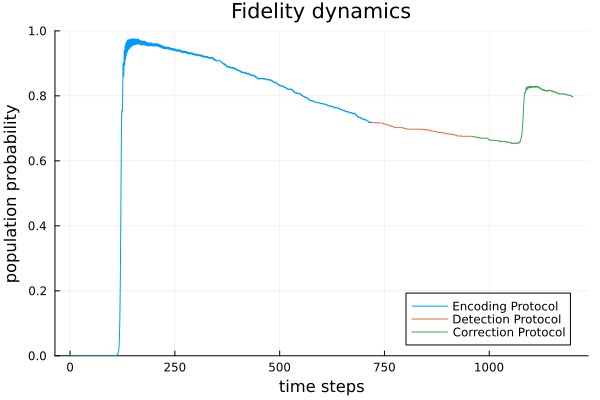

In [51]:
# @load "Z:/master_work/5_atom_correction/decay_1e_4/N_atoms=5_γ_decay=0.0001_Ntraj=100_avg.jld2"
@load "C:/Users/14aka/OneDrive/Documents/master_work/N_atoms=5_γ_decay=0.0001_Ntraj=1000_timeratio_31_avg.jld2"

avg_population_data = avg_population_data;
avg_corrected_population_data = avg_corrected_population_data;
avg_fidelity_data = avg_fidelity_data;

t1 = [0:0.1:3*240;]
t2 = [3*240+0.1:0.1:4*240;]
t3 = [4*240:0.1:5*240;]

avg_population_data1 = avg_population_data[:abc][1:length(t1)]
avg_population_data2 = avg_population_data[:abc][length(t1)+1:end]

plot(t1, avg_population_data1,  ylim=[0,1], label="Encoding Protocol", xlabel="time steps", ylabel="population probability", title="Fidelity dynamics")
plot!(t2, avg_population_data2, label="Detection Protocol")
plot!(t3,avg_fidelity_data, ylim=[0,1], label="Correction Protocol")

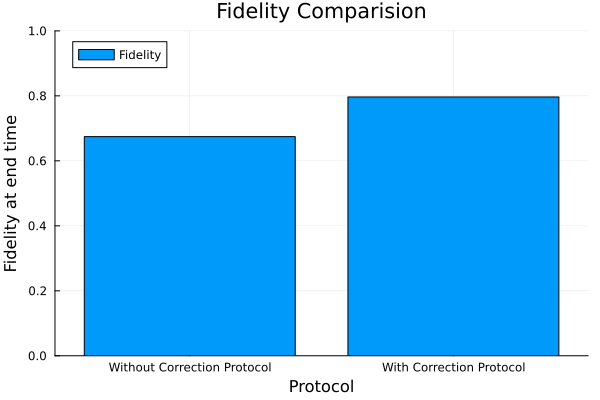

In [52]:
x = ["Without Correction Protocol", "With Correction Protocol"]
y = [avg_population_data[:abc][end], avg_fidelity_data[end]]
bar(x,y, ylim=[0,1], label="Fidelity", title="Fidelity Comparision", xlabel="Protocol", ylabel="Fidelity at end time")

In [53]:
println("Fidelity at end time without correction protocol: ", avg_population_data[:abc][end])
println("Fidelity at end time with correction protocol: ", avg_fidelity_data[end])

Fidelity at end time without correction protocol: 0.6745397532417169
Fidelity at end time with correction protocol: 0.7965469489054209


### Fidelity vs Time ratio analysis

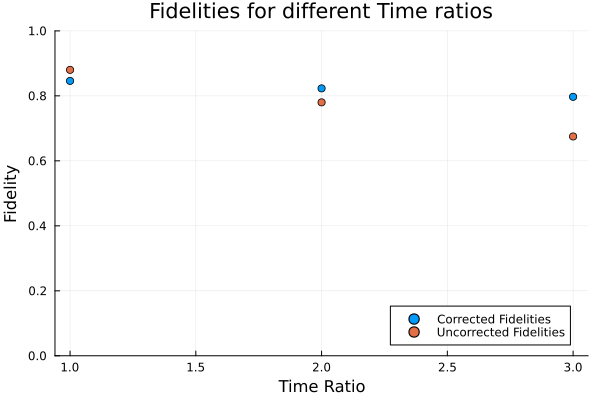

In [76]:
#T1:T2
time_ratios = [1,2,3]
corrected_fidelities = [0.846,0.823,0.797]
uncorrected_fidelities = [0.880,0.780,0.675]

# x = ["1:1", "2:1", "3:1"]
# y = hcat(corrected_fidelities,uncorrected_fidelities)
# groupedbar(x,[corrected_fidelities,uncorrected_fidelities], label=["Corrected Fidelity","Uncorrected Fidelity"], bar_position=:dodge, title="Fidelity Comparision", xlabel="T1:T2", ylabel="Fidelity at end time")
# bar!(x, uncorrected_fidelities, label="Uncorrected Fidelity")

scatter(time_ratios,corrected_fidelities,ylim=[0,1],label="Corrected Fidelities", xlabel="Time Ratio", ylabel="Fidelity",title="Fidelities for different Time ratios")
scatter!(time_ratios,uncorrected_fidelities,label="Uncorrected Fidelities")

## Gamma = 1e-5

### Single Trajectory analysis

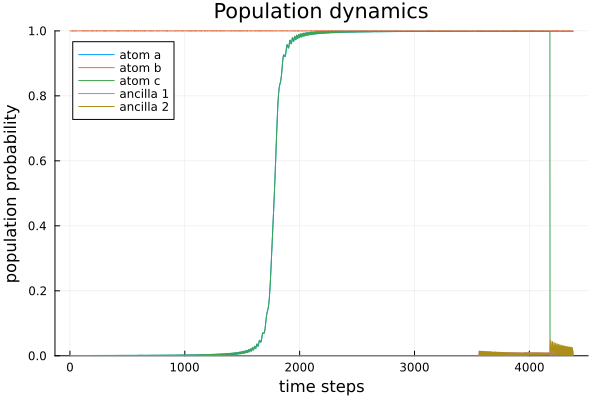

In [ ]:
##### Not Corrected - Trajectory 255, 616, 991

@load "C:/Users/14aka/OneDrive/Documents/master_work/jump_files/jumps_991.jld2"
# has_error population_data corrected_population_data fidelity_data end_time
population_data = population_data;
corrected_population_data = corrected_population_data;
fidelity_data = fidelity_data;
# end_time = end_time;

plot(population_data[:a],  ylim=[0,1], label="atom a", xlabel="time steps", ylabel="population probability", title="Population dynamics")
plot!(population_data[:b], label="atom b")
plot!(population_data[:c], label="atom c")
plot!(population_data[:a1],label="ancilla 1")
plot!(population_data[:a2], label="ancilla 2")

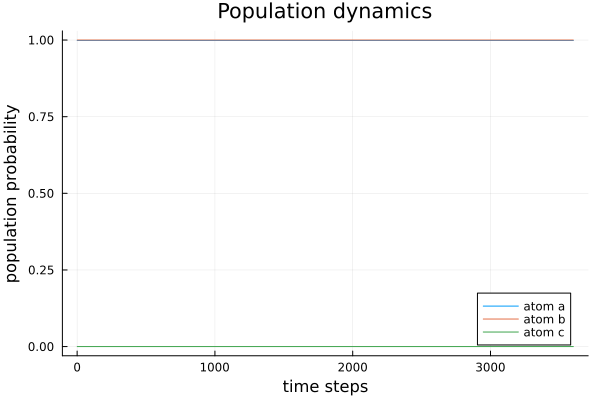

In [63]:
plot(corrected_population_data[:a], label="atom a", xlabel="time steps", ylabel="population probability", title="Population dynamics")
plot!(corrected_population_data[:b], label="atom b")
plot!(corrected_population_data[:c], label="atom c")
# plot!(corrected_population_data[:a1],label="ancilla 1")
# plot!(corrected_population_data[:a2], label="ancilla 2")

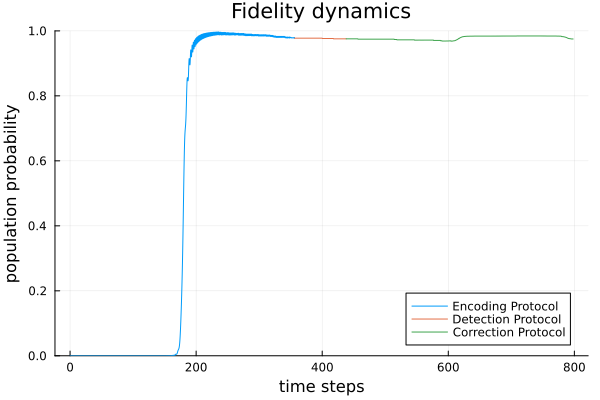

In [ ]:
# @load "Z:/master_work/5_atom_correction/decay_1e_4/N_atoms=5_γ_decay=0.0001_Ntraj=100_avg.jld2"
@load "C:/Users/14aka/OneDrive/Documents/master_work/N_atoms=5_γ_decay=0.00001_Ntraj=1000_avg.jld2"

avg_population_data = avg_population_data;
avg_corrected_population_data = avg_corrected_population_data;
avg_fidelity_data = avg_fidelity_data;

t1 = [0:0.1:T1;]
t2 = [T1+0.1:0.1:T1+T2;]
t3 = [T1+T2:0.1:T1+T2+T3;]

avg_population_data1 = avg_population_data[:abc][1:length(t1)]
avg_population_data2 = avg_population_data[:abc][length(t1)+1:end]

plot(t1, avg_population_data1,  ylim=[0,1], label="Encoding Protocol", xlabel="time steps", ylabel="population probability", title="Fidelity dynamics")
plot!(t2, avg_population_data2, label="Detection Protocol")
plot!(t3,avg_fidelity_data, ylim=[0,1], label="Correction Protocol")

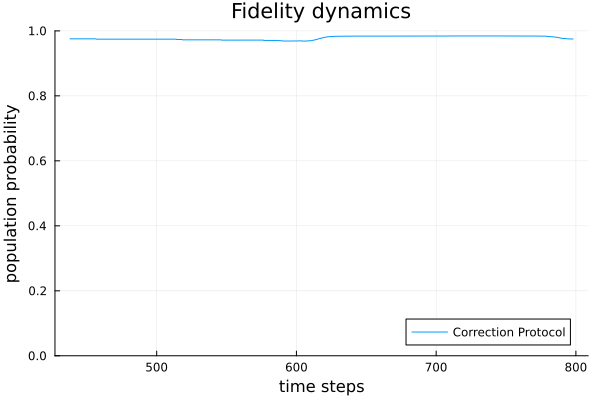

In [65]:
plot(t3, avg_fidelity_data, ylim=[0,1], label="Correction Protocol", xlabel="time steps", ylabel="population probability", title="Fidelity dynamics")

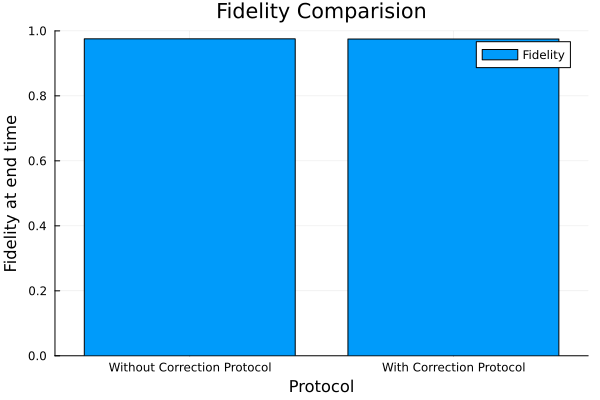

In [3]:
x = ["Without Correction Protocol", "With Correction Protocol"]
y = [avg_population_data[:abc][end], avg_fidelity_data[end]]
bar(x,y, ylim=[0,1], label="Fidelity", title="Fidelity Comparision", xlabel="Protocol", ylabel="Fidelity at end time")

In [4]:
println("Fidelity at end time without correction protocol: ", avg_population_data[:abc][10*356])
println("Fidelity at end time with correction protocol: ", avg_fidelity_data[2400])

Fidelity at end time without correction protocol: 0.9797234779833016
Fidelity at end time with correction protocol: 0.9839880567789078
